### Laboratorium 4 - zadania

In [1]:
import os

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries, slic

#### Zadanie 1

Dane są obrazy `tabby` i `pills`. Wykonaj dla nich segmentację przy użyciu algorytmu SLIC. Celem jest uzyskanie **jednolitych**  superpikseli, a więc zawierających tylko fragmenty obiektów lub tylko tła (a nie jednego i drugiego naraz). Przeanalizuj zachowanie algorytmu dla różnej liczby superpikseli i parametru sigma.

Zwróć uwagę, że wynikiem działania scikitowej implementacji SLIC - [`skimage.segmentation.slic`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.slic) - (podobnie jak wielu innych algorytmów klasyfikacyjnych) jest obraz typu `np.int64` przyporządkowujący każdemu pikselowi obrazu wejściowego indeks superpiksela. Takiej reprezentacji oczekuje też funkcja [`mark_boundaries`](https://scikit-image.org/docs/stable/api/skimage.segmentation.html#skimage.segmentation.mark_boundaries).

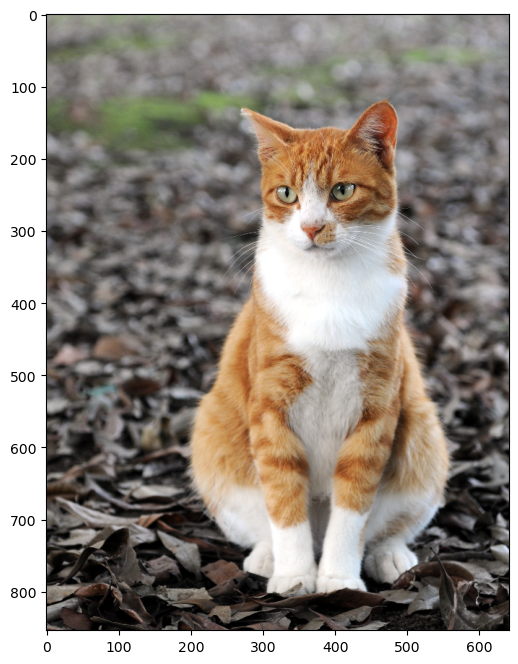

In [2]:
_ = cv2.imread('tabby.jpg')[..., ::-1]
tabby = cv2.resize(_, dsize=None, fx=0.3, fy=0.3)
plt.subplots(1,1,figsize=(8,8))[1].imshow(tabby);

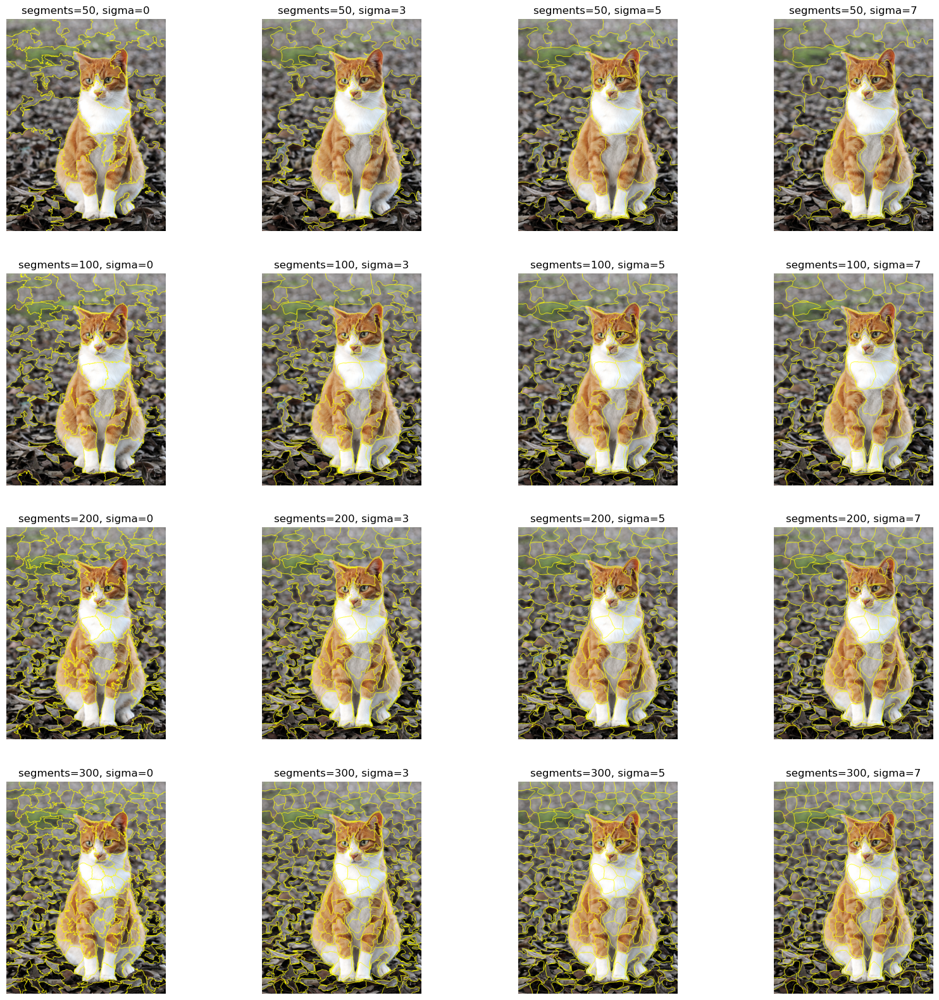

In [3]:
segments = [
    50, 100, 200, 300
]

sigmas = [
    0, 3, 5, 7
]

fig, axs = plt.subplots(len(segments), len(sigmas), figsize=(20, 20))

for i, segment in enumerate(segments):
    for j, sigma in enumerate(sigmas):
        tabby_slic = slic(tabby, n_segments=segment, compactness=10, sigma=sigma)
        axs[i, j].imshow(mark_boundaries(tabby, tabby_slic))
        axs[i, j].set_title(f'segments={segment}, sigma={sigma}')
        axs[i, j].axis('off')

plt.show()

Algorytm SLIC parmametry:

* `n_segments` - liczba superpikseli
    * mała wartość powoduje powstanie dużych superpikseli i co za tym idzie mniejszą precyzję segmentacji
    * duża wartość powoduje powstanie małych superpikseli i co za tym idzie większą precyzję segmentacji skutkuje to zwiększeniem czasu obliczeń 

* `sigma` - pozwala kontrolować jak bardzo superpiksele są "okrągłe", konkretniej jest to szerokość kernela Gaussowskiego używanego do wygładzenia obrazu przed podziałem na superpiksele
    * mała wartość powoduje, że superpiksele są podatne na szczegóły jak i na szum
    * duża wartość powoduje, że superpiksele są bardziej jednolite ale mogą też zatracać szczegóły

(-0.5, 640.5, 853.5, -0.5)

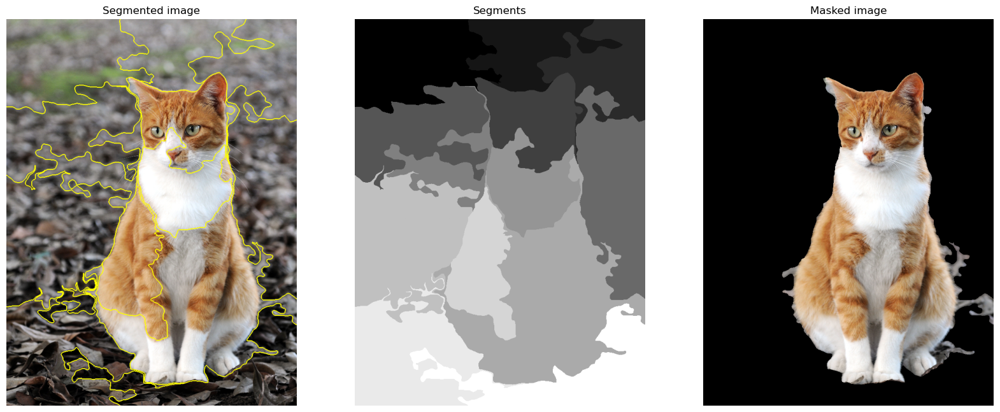

In [4]:
sigma = 3
segments = 20

fig, axs = plt.subplots(1, 3, figsize=(20, 20))

tabby_slic = slic(tabby, n_segments=segments, compactness=10, sigma=sigma)
segments_with_tabby = [4]

segments_with_tabby = [4, 8, 9, 11]

maaksed_image = np.zeros_like(tabby)
for segment in segments_with_tabby:
    maaksed_image[tabby_slic == segment] = tabby[tabby_slic == segment]

axs[0].imshow(mark_boundaries(tabby, tabby_slic))
axs[0].set_title('Segmented image')
axs[0].axis('off')

# Show number of segments
axs[1].imshow(tabby_slic, cmap='gray')
axs[1].set_title('Segments')
axs[1].axis('off')

axs[2].imshow(maaksed_image)
axs[2].set_title('Masked image')
axs[2].axis('off')


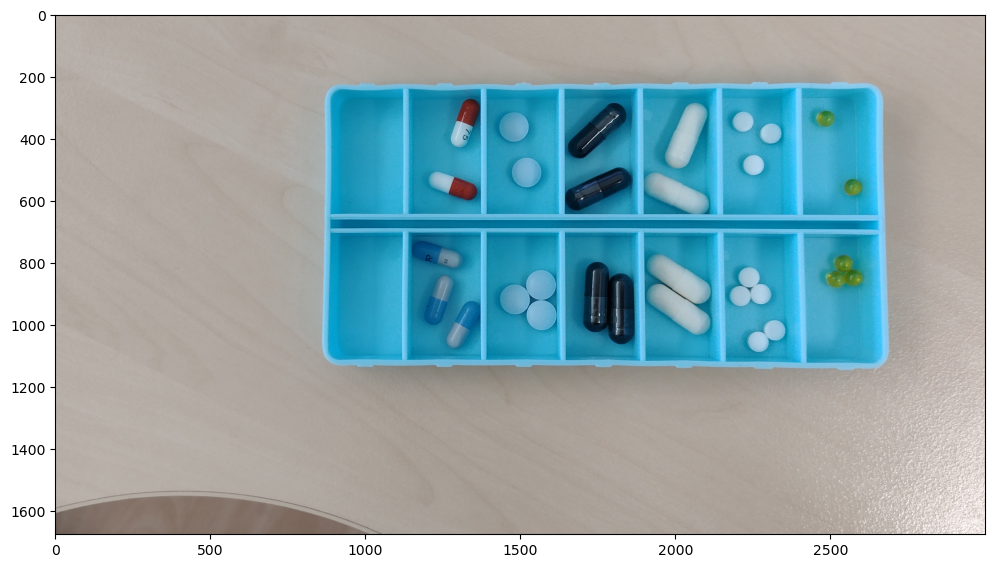

In [5]:
pills = cv2.imread('pills.png')[..., ::-1]
plt.subplots(1,1,figsize=(12,8))[1].imshow(pills);

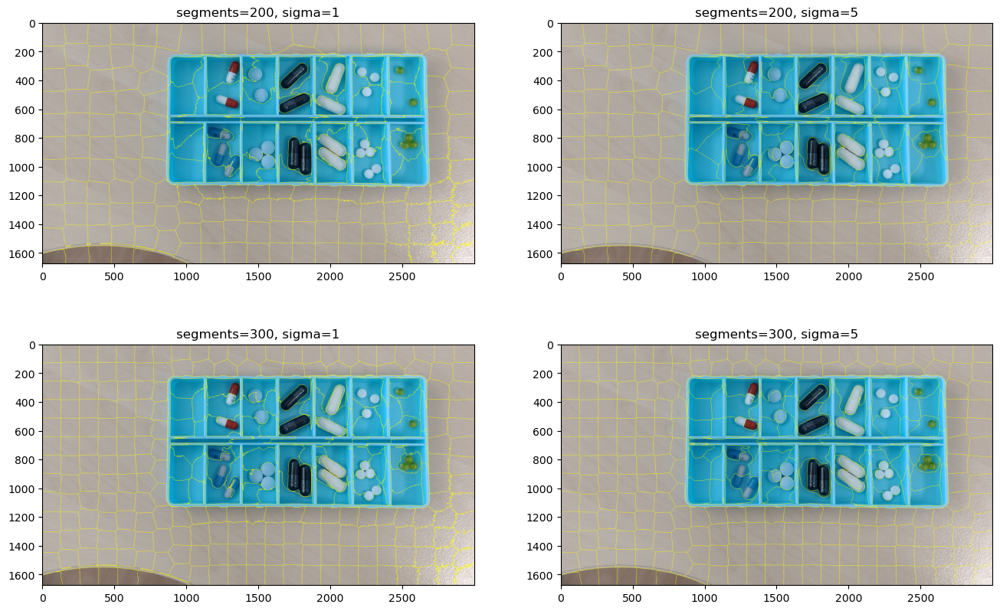

In [6]:
segments = [200, 300]
sigmas = [1, 5]

fig, axs = plt.subplots(len(segments), len(sigmas), figsize=(16, 10))

for i, segment in enumerate(segments):
    for j, sigma in enumerate(sigmas):
        pills_slic = slic(pills, n_segments=segment, compactness=10, sigma=sigma)
        axs[i, j].imshow(mark_boundaries(pills, pills_slic))
        axs[i, j].set_title(f'segments={segment}, sigma={sigma}')

plt.show()

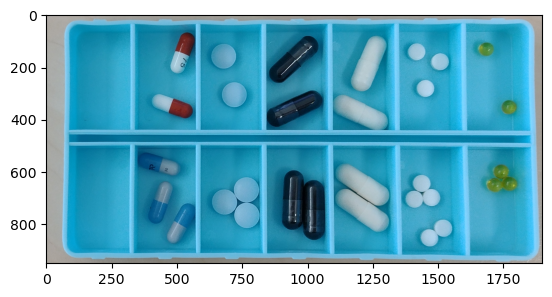

In [7]:
box_pills = pills[200:1150, 800:2700, :]
plt.imshow(box_pills)

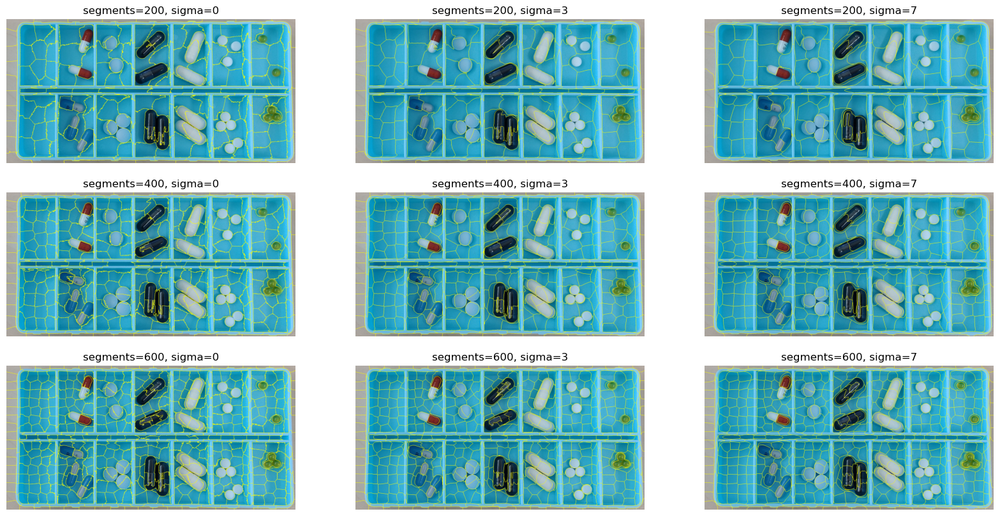

In [8]:
segments = [
    200, 400, 600
]

sigmas = [
    0, 3, 7
]

fig, axs = plt.subplots(len(segments), len(sigmas), figsize=(20, 10))

for i, segment in enumerate(segments):
    for j, sigma in enumerate(sigmas):
        box_pills_slic = slic(box_pills, n_segments=segment, sigma=sigma)
        axs[i, j].imshow(mark_boundaries(box_pills, box_pills_slic))
        axs[i, j].set_title(f'segments={segment}, sigma={sigma}')
        axs[i, j].axis('off')

plt.show()

#### Zadanie 2

Dla obrazu `tabby` wykonaj post-processing segmentacji SLIC by uzyskać dwa jednorodne obszary: jeden zawierający wyłącznie kota, drugi zawierający wyłącznie tło.

Można to zadanie potraktować jako binaryzację na poziomie superpikseli i zrealizować je za pomocą progowania. 
Można też potraktować je jako klasteryzację superpikseli i wykorzystać np. [`cv2.kmeans`](https://docs.opencv.org/4.x/d5/d38/group__core__cluster.html#ga9a34dc06c6ec9460e90860f15bcd2f88).  
Niezależnie od wybranej ścieżki, konieczne będzie opisanie każdego z superpikseli za pomocą jakiejś *cechy* go opisującej (lub kilku cech). Najprostszymi cechami mogą być np. średnie wartości składowych barwy pikseli wchodzących w skład superpiksela.  
Do zastanowienia: jakie parametry SLICa wybrać jako podstawę w tym zadaniu?

Zaprezentuj wyniki albo za pomocą `mark_boundaries` albo wyświetlając maskę binarną.

---

NumPy pro-tip: aby uzyskać zbiór wszystkich pikseli obrazu o wartości np. 3 możesz użyć notacji: ```obraz==3```. Wynikiem jest macierz boolowska, której można używać jako selektor. Np. aby na obrazie `A` wyzerować wszystkie piksele, którym w obrazie `B` odpowiada wartość 5, możesz napisać:  
```A[B==5] = 0```  
Ten zapis jest **znacznie** szybszy niż manualne iterowanie po obrazach i sprawdzanie warunków if-ami.

---

Przykładowe użycie `cv2.kmeans` (więcej możesz poczytać np. [tutaj](https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_ml/py_kmeans/py_kmeans_opencv/py_kmeans_opencv.html)):
```python
c, labels, centers = cv2.kmeans(
    data=data,  # np.ndarray typu float o wymiarach NxK gdzie N to liczba sampli (u nas: superpikseli), K - liczba cech
    K=2,        # oczekiwana liczba klastrów
    bestLabels=None,
    criteria=(cv2.TERM_CRITERIA_EPS, 10, 1.0),  # przykładowe kryteria stopu
    attempts=1, # liczba powtórzeń algorytmu
    flags=cv2.KMEANS_RANDOM_CENTERS  # sposób inicjalizacji klastrów
)
```

Funkcja ta zwraca krotkę, której najważniejszym komponentem jest ten drugi (tu: `labels`), tj. macierz o wymiarach Nx1, zawierająca indeks klastra przypisanego i-temu samplowi.

In [88]:
# zacznij od przygotowania macierzy wejściowej (data) reprezentującej superpiksele jako punkty danych
from scipy import stats

def prepare_segments(image, number_segments, sigma, compactness=30, type='mean'):
    segments = slic(image, n_segments=number_segments, sigma=sigma, compactness=compactness)

    annotated_image = np.zeros_like(image)
    for segment in np.unique(segments):
        mask = segments == segment
        if type == 'mean':
            color = image[mask].mean(axis=0)
        elif type == 'median':
            color = np.median(image[mask], axis=0)
        elif type == 'mode':
            # Calculate dominant color for each channel
            color = np.array([
                stats.mode(image[mask][:, i], keepdims=True)[0][0]
                for i in range(3)
            ])
        elif type == 'min':
            color = image[mask].min(axis=0)
        elif type == 'max':
            color = image[mask].max(axis=0)
        elif type == 'std':
            color = image[mask].mean(axis=0)
        else:
            raise ValueError(f'Unknown type: {type}')
        
        annotated_image[mask] = color

    return annotated_image, segments

def prepare_segments_with_atributes(image, number_segments, sigma, compactness=30):
    segments = slic(image, n_segments=number_segments, sigma=sigma, compactness=compactness)

    segements_with_atributes = {}
    for segment in np.unique(segments):
        mask = segments == segment
        segment_image = image[mask]

        segements_with_atributes[segment] = {
            'mean': np.mean(segment_image, axis=0),
            'std': np.std(segment_image, axis=0),
            'median': np.median(segment_image, axis=0),
            'mode': np.array([
                stats.mode(image[mask][:, i], keepdims=True)[0][0]
                for i in range(3)
            ]),
            'min': np.min(segment_image, axis=0),
            'max': np.max(segment_image, axis=0),
        }

    return segements_with_atributes, segments


def prepare_segments_with_atributes_hsv(image, number_segments, sigma, compactness=30):
    image_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    segments = slic(image, n_segments=number_segments, sigma=sigma, compactness=compactness)

    segements_with_atributes = {}
    for segment in np.unique(segments):
        mask = segments == segment
        segment_image = image_hsv[mask]

        segements_with_atributes[segment] = {
            'mean': np.mean(segment_image, axis=0),
            'std': np.std(segment_image, axis=0),
            'median': np.median(segment_image, axis=0),
            'mode': np.array([
                stats.mode(image[mask][:, i], keepdims=True)[0][0]
                for i in range(3)
            ]),
            'min': np.min(segment_image, axis=0),
            'max': np.max(segment_image, axis=0),
        }

    return segements_with_atributes, segments

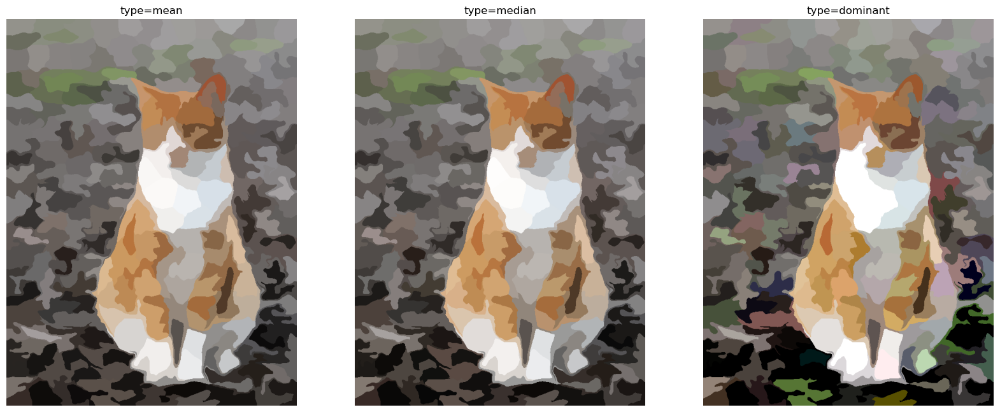

In [10]:
types = ['mean', 'median', 'dominant']
number_segments = 250
sigma = 3
compactness = 10

fig, axs = plt.subplots(1, len(types), figsize=(20, 10))

for i, type in enumerate(types):
    annotated_image, segments = prepare_segments(tabby, number_segments, sigma, compactness, type)
    axs[i].imshow(annotated_image)
    axs[i].set_title(f'type={type}')
    axs[i].axis('off')

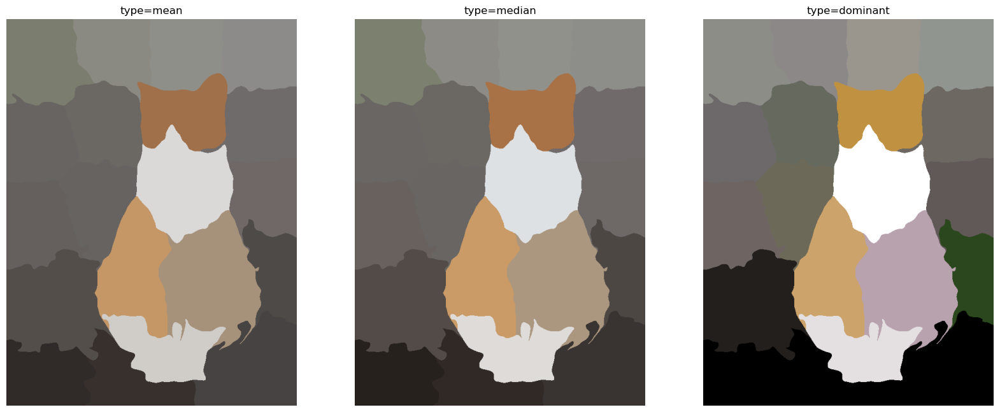

In [11]:
types = ['mean', 'median', 'dominant']
number_segments = 20
sigma = 5
compactness = 30

fig, axs = plt.subplots(1, len(types), figsize=(20, 10))

for i, type in enumerate(types):
    annotated_image, segments = prepare_segments(tabby, number_segments, sigma, compactness, type)
    axs[i].imshow(annotated_image)
    axs[i].set_title(f'type={type}')
    axs[i].axis('off')

In [12]:
attributes, segments = prepare_segments_with_atributes(tabby, number_segments, sigma)

# change attributes to atribute_r, atribute_g, atribute_b
print(f'Before: {attributes[4]}')

for segment, atributes in attributes.items():
    attributes[segment] = {
        f'{key}_{channel}': value[i]
        for key, value in atributes.items()
        for i, channel in enumerate(['r', 'g', 'b'])
    }


print(f'After: {attributes[4]}')


Before: {'mean': array([140.25162241, 139.74152964, 137.66114584]), 'std': array([16.24335887, 17.52810268, 17.42739963]), 'median': array([141., 141., 138.]), 'mode': array([145, 149, 143], dtype=uint8), 'min': array([82, 78, 76], dtype=uint8), 'max': array([190, 186, 191], dtype=uint8)}
After: {'mean_r': 140.25162240713462, 'mean_g': 139.74152964127882, 'mean_b': 137.6611458374806, 'std_r': 16.243358866487014, 'std_g': 17.528102678340666, 'std_b': 17.427399627098207, 'median_r': 141.0, 'median_g': 141.0, 'median_b': 138.0, 'mode_r': 145, 'mode_g': 149, 'mode_b': 143, 'min_r': 82, 'min_g': 78, 'min_b': 76, 'max_r': 190, 'max_g': 186, 'max_b': 191}


In [13]:
# change to array NxK where N is number of segments and K is number of features

X = np.array([list(attributes[segment].values()) for segment in np.unique(segments)])

# 6 features for each segment (mean, std, median, mode, min, max for each channel) => 18 features

X.shape

(20, 18)

In [14]:
def cluster_segments(segments, X, K=2, max_iter=500, epsilon=0.1, attempts=10):
   
    # Set the k-means criteria and flags
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, max_iter, epsilon)
    flags = cv2.KMEANS_PP_CENTERS
    
    # Perform k-means clustering
    _, labels, centers = cv2.kmeans(
        data=X.astype(np.float32),
        K=K,
        bestLabels=None,
        criteria=criteria,
        attempts=attempts,
        flags=flags
    )
    
    # Assign each segment to its respective cluster
    clustered_segments = np.zeros_like(segments)
    for i, segment in enumerate(np.unique(segments)):
        clustered_segments[segments == segment] = labels[i]
    
    return clustered_segments


In [96]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_clusters(tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[0], title='Clusters'):
    
    fig, axs = plt.subplots(2, 2, figsize=(8, 8))

    # Prepare segments using the provided parameters
    annotated_image, segments = prepare_segments(tabby, number_segments, sigma, compactness, 'mean' if title == 'Clusters' else title)
    
    # Display the segments
    axs[0, 0].imshow(annotated_image)
    axs[0, 0].set_title('Segments')
    axs[0, 0].axis('off')

    # Display the clusters
    axs[0, 1].set_title('Clusters')
    axs[0, 1].axis('off')
    fig.colorbar(axs[0, 1].imshow(clustered_segments, cmap='tab10'), ax=axs[0, 1])

    # Initialize mask and clustered image
    mask = np.zeros_like(clustered_segments)
    clustered_image = np.zeros_like(tabby)

    # Show only the selected clusters
    for cluster in clusters_to_show:
        clustered_image[clustered_segments == cluster] = tabby[clustered_segments == cluster]
        mask[clustered_segments == cluster] = 1

    # Display the clustered image
    axs[1, 0].imshow(clustered_image)
    axs[1, 0].set_title('Clustered image')
    axs[1, 0].axis('off')

    # Display the mask
    axs[1, 1].imshow(mask, cmap='gray')
    axs[1, 1].set_title('Mask')
    axs[1, 1].axis('off')

    # Show the figure
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()


def visualize_clusters_hsv(tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[0], title='Clusters'):
        tabby_rgb = cv2.cvtColor(tabby, cv2.COLOR_HSV2RGB)
    
        fig, axs = plt.subplots(2, 2, figsize=(8, 8))

        # Prepare segments using the provided parameters

        annotated_image, segments = prepare_segments(tabby_rgb, number_segments, sigma, compactness, 'mean')

        
        # Display the segments
        axs[0, 0].imshow(annotated_image)
        axs[0, 0].set_title('Segments')
        axs[0, 0].axis('off')

        # Display the clusters
        axs[0, 1].set_title('Clusters')
        axs[0, 1].axis('off')
        fig.colorbar(axs[0, 1].imshow(clustered_segments, cmap='tab10'), ax=axs[0, 1])

        # Initialize mask and clustered image
        mask = np.zeros_like(clustered_segments)
        clustered_image = np.zeros_like(tabby)

        # Show only the selected clusters
        for cluster in clusters_to_show:
            clustered_image[clustered_segments == cluster] = tabby_rgb[clustered_segments == cluster]
            mask[clustered_segments == cluster] = 1

        # Display the clustered image
        axs[1, 0].imshow(clustered_image)
        axs[1, 0].set_title('Clustered image')
        axs[1, 0].axis('off')

        # Display the mask
        axs[1, 1].imshow(mask, cmap='gray')
        axs[1, 1].set_title('Mask')
        axs[1, 1].axis('off')

        # Show the figure
        fig.suptitle(title)
        plt.tight_layout()
        plt.show()


In [66]:
clustered_segments = cluster_segments(segments, X, K=2)
print(np.unique(clustered_segments))

[0 1]


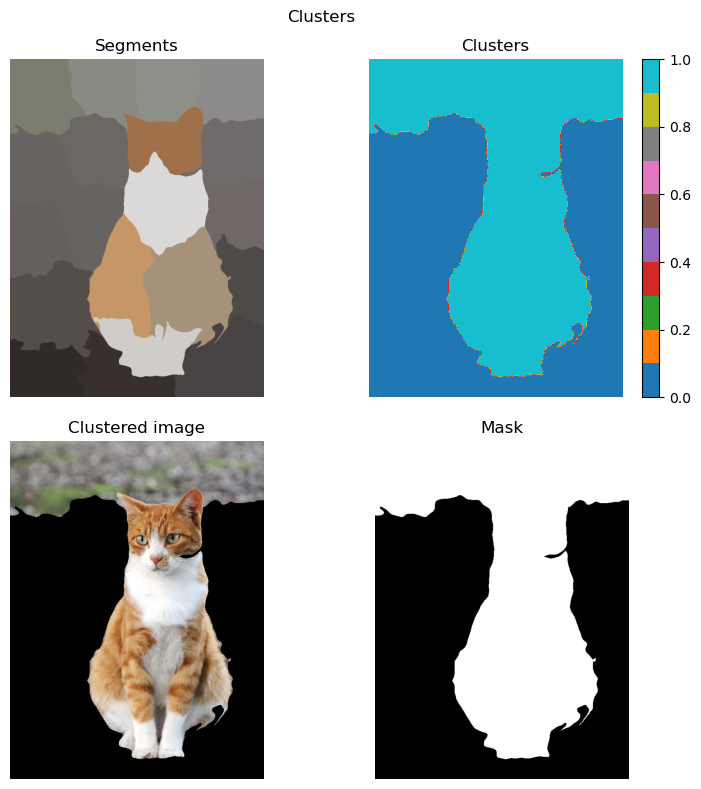

In [18]:
visualize_clusters(tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[1])

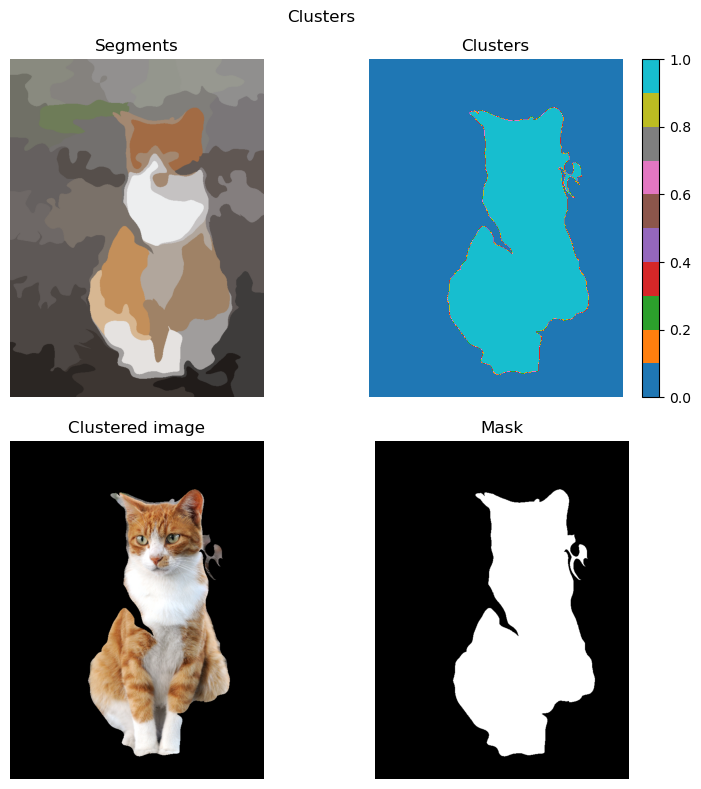

In [100]:
hsv_tabby = cv2.cvtColor(tabby, cv2.COLOR_RGB2HSV)
number_segments = 42
sigma = 8
compactness = 10

attributes, segments = prepare_segments_with_atributes_hsv(tabby, number_segments, sigma, compactness)

X = np.array([list(attributes[segment].values()) for segment in np.unique(segments)])

# get 3 first features
X = X[:, :3]

clustered_segments = cluster_segments(segments, X, K=2)

visualize_clusters_hsv(hsv_tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[1])

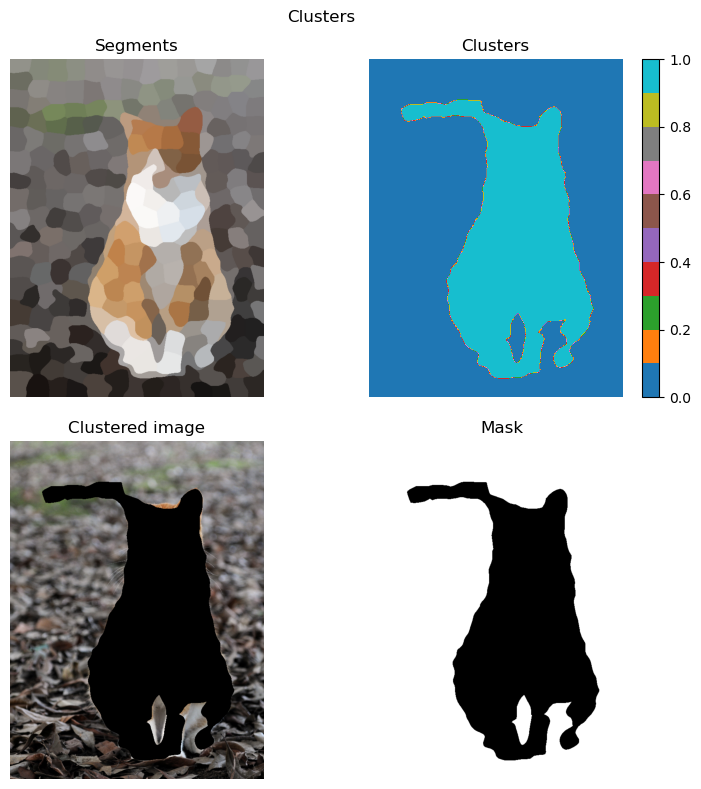

In [101]:
hsv_tabby = cv2.cvtColor(tabby, cv2.COLOR_RGB2HSV)
number_segments = 250
sigma = 8
compactness = 20

attributes, segments = prepare_segments_with_atributes_hsv(tabby, number_segments, sigma, compactness)

X = np.array([list(attributes[segment].values()) for segment in np.unique(segments)])

# get 3 first features
X = X[:, :3]

clustered_segments = cluster_segments(segments, X, K=2)

visualize_clusters_hsv(hsv_tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[0])

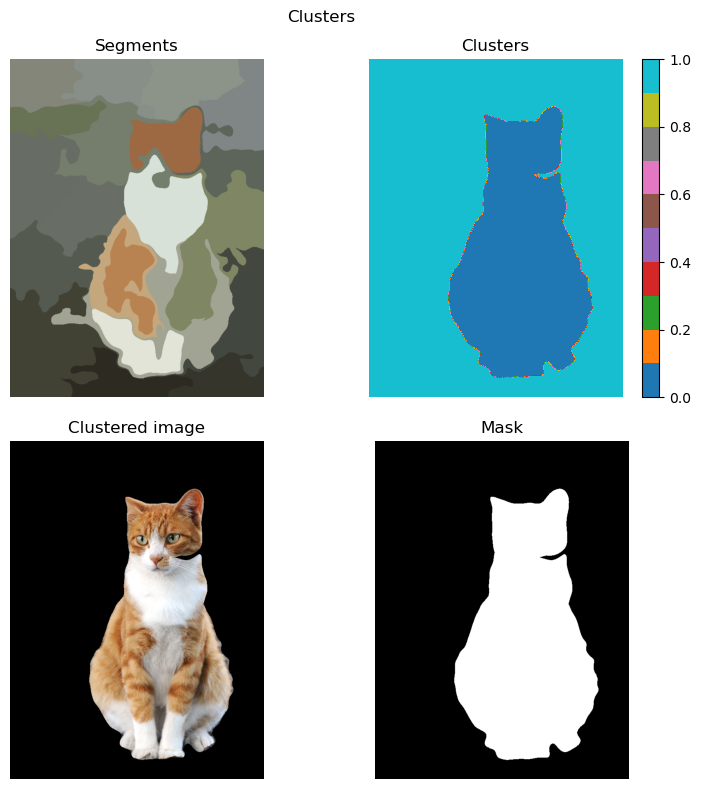

In [91]:
hsv_tabby = cv2.cvtColor(tabby, cv2.COLOR_RGB2HSV)
number_segments = 25
sigma = 8
compactness = 20

attributes, segments = prepare_segments_with_atributes_hsv(tabby, number_segments, sigma, compactness)

X = np.array([list(attributes[segment].values()) for segment in np.unique(segments)])

# get 3 first features
X = X[:, :3]

clustered_segments = cluster_segments(segments, X, K=2)

visualize_clusters_hsv(hsv_tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[0])

In [30]:
clustered_segments = cluster_segments(segments, X, K=6)

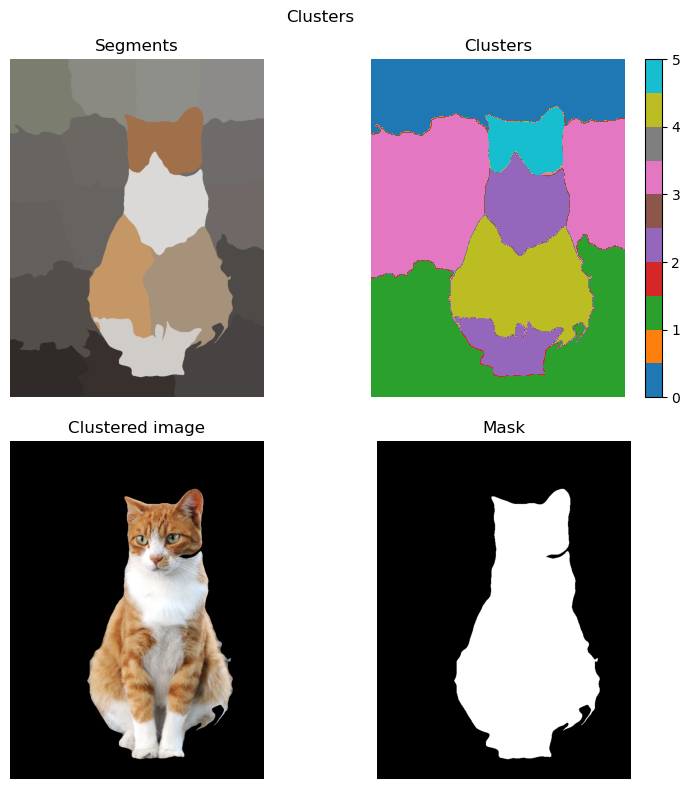

In [32]:
visualize_clusters(tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[2, 4, 5])

Feature: mean, shape: (20, 3)


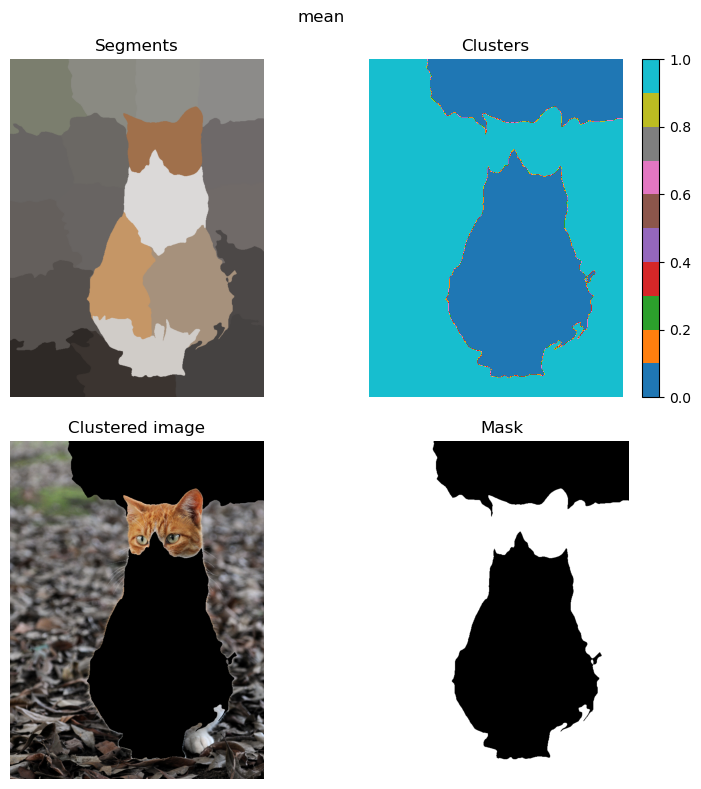

Feature: std, shape: (20, 3)


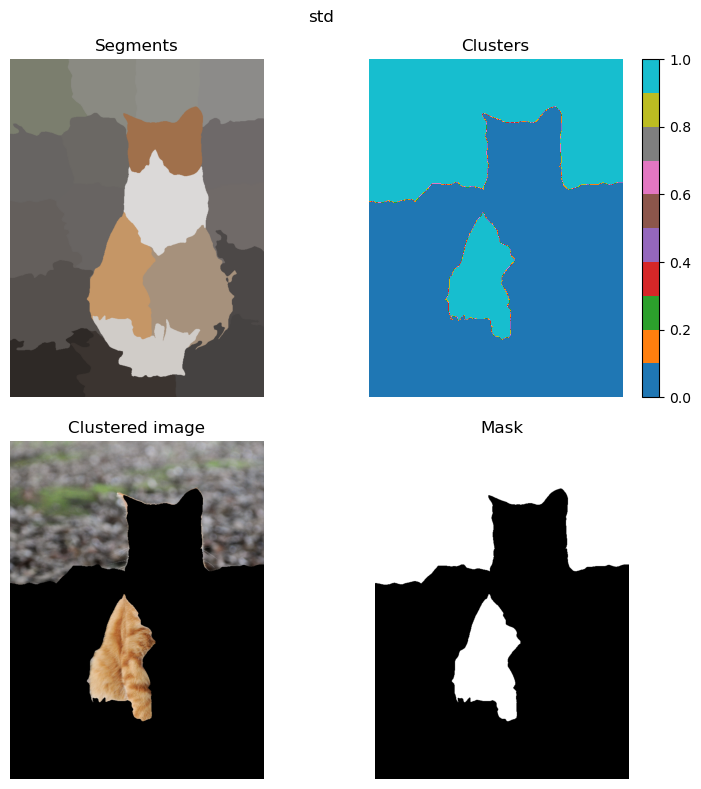

Feature: median, shape: (20, 3)


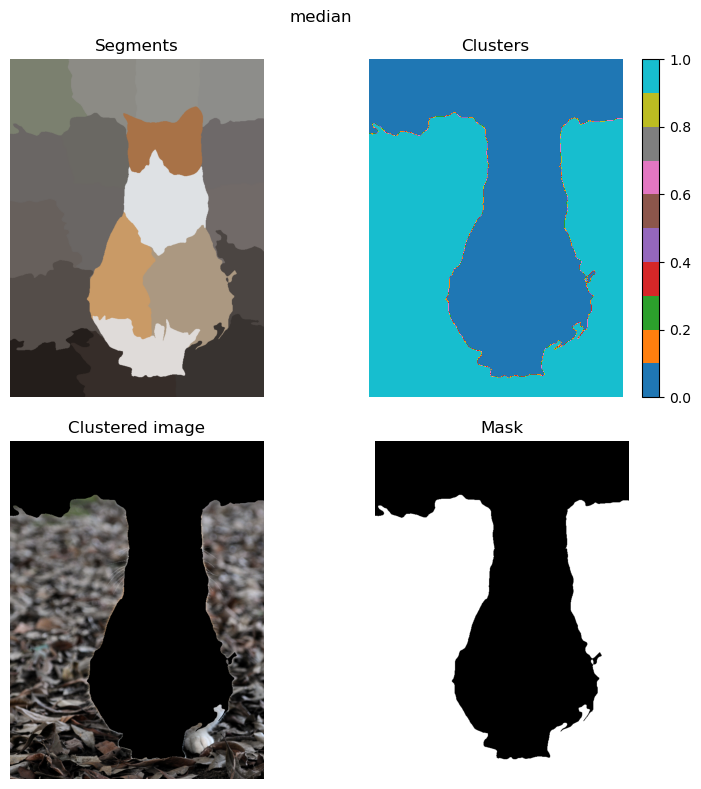

Feature: mode, shape: (20, 3)


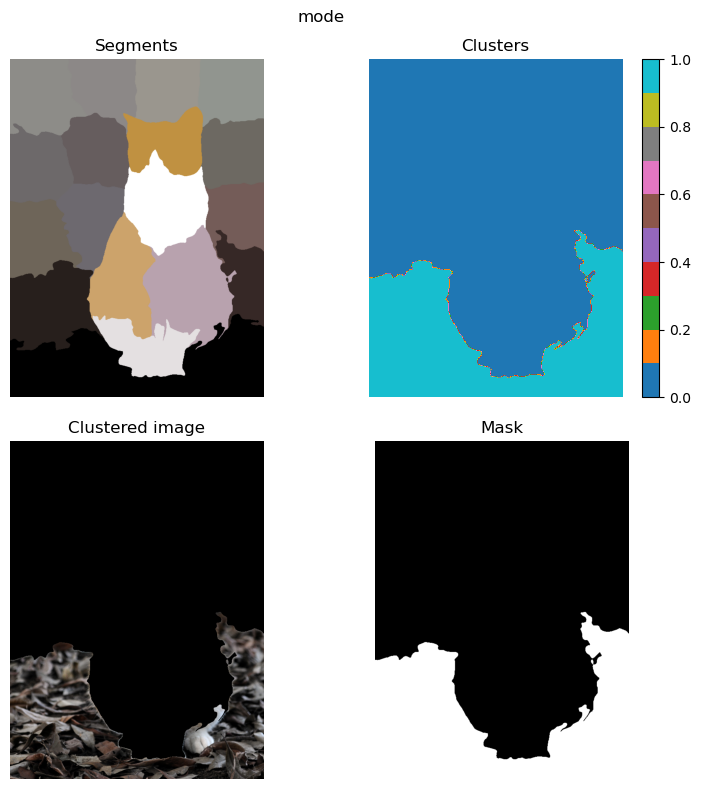

Feature: min, shape: (20, 3)


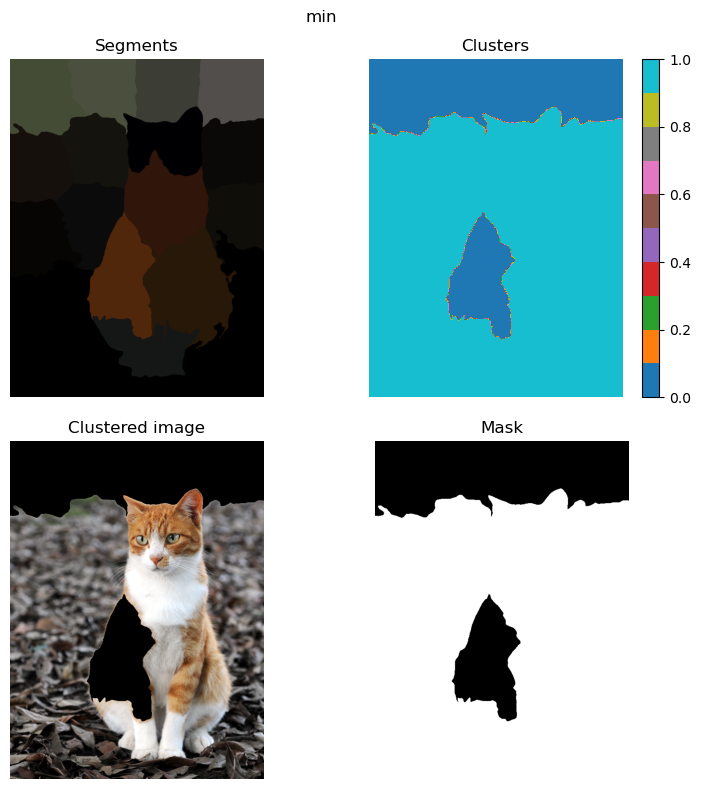

Feature: max, shape: (20, 3)


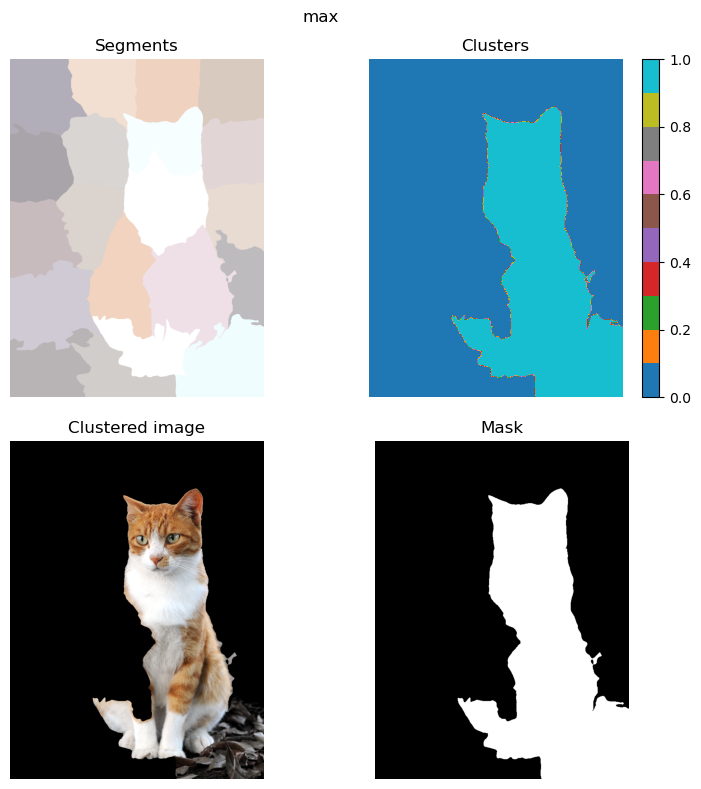

In [47]:
attributes, segments = prepare_segments_with_atributes(tabby, number_segments, sigma)

featues = ['mean', 'std', 'median', 'mode', 'min', 'max']

for featue in featues:
    X = np.array([list(attributes[segment][featue]) for segment in np.unique(segments)])
    print(f'Feature: {featue}, shape: {X.shape}')
    clustered_segments = cluster_segments(segments, X, K=2)
    visualize_clusters(tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[1], title=featue)


Features: ['max', 'median'], shape: (20, 6)


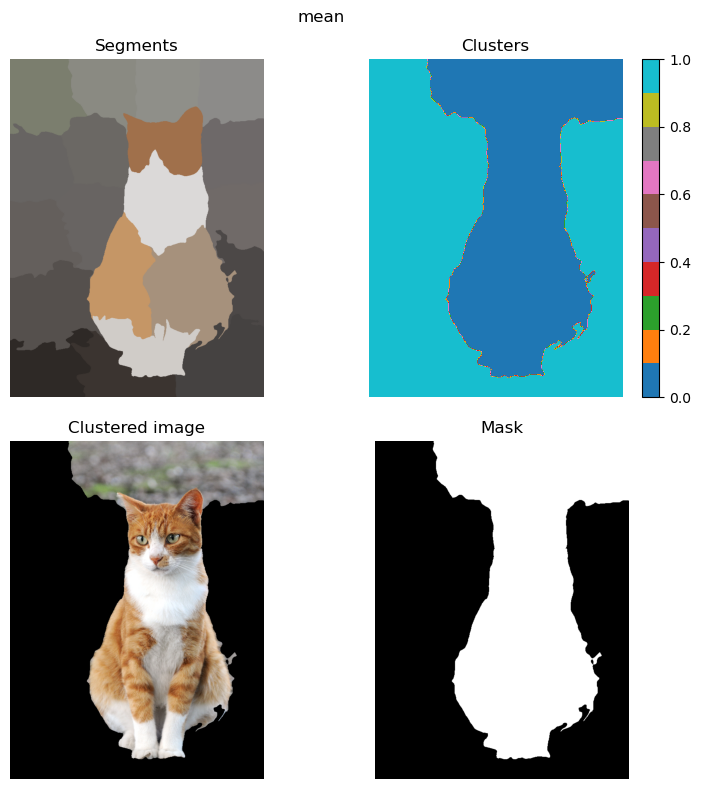

In [58]:
attributes, segments = prepare_segments_with_atributes(tabby, number_segments, sigma)

chosen_features = ['max', 'median']

X = np.array([np.concatenate([attributes[segment][feature] for feature in chosen_features]) for segment in np.unique(segments)])

print(f'Features: {chosen_features}, shape: {X.shape}')

clustered_segments = cluster_segments(segments, X, K=2)
visualize_clusters(tabby, number_segments, sigma, compactness, clustered_segments, clusters_to_show=[0], title='mean')